# Objective: fine-tuning DETR

-   This notebook is used to predict the images in engineering material dataset. The weights from DETR training are loaded from 6th epoch and prediction is done 

## Define useful boilerplate functions

Adapted from:
-   https://colab.research.google.com/github/facebookresearch/detr/blob/colab/notebooks/detr_attention.ipynb

In [1]:
# Mount the google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install -U torch==1.7.0
!pip install -U torchvision==0.8.1 
!pip install -U torchtext==0.8.0

     |████████████████████████████████| 776.7 MB 4.7 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.10.0+cu102 requires torch==1.9.0, but you have torch 1.7.0 which is incompatible.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.7.0 which is incompatible.
     |████████████████████████████████| 12.7 MB 4.5 MB/s 
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
     |████████████████████████████████| 6.9 MB 4.9 MB/s 
  Attempting uninstall: torchtext
    Found existing installation: torchtext 0.10.0
    Uninstalling torchte

In [3]:
import torch, torchvision
print(torch.__version__, torchvision.__version__, torch.cuda.is_available())

torch.set_grad_enabled(False);

1.7.0 0.8.1 False


## Copy the processed datasets

In [4]:
! cp  '/content/drive/My Drive/eva6_capstone_final/engineering_processed_dataset_valid_annotation.zip' .
! cp '/content/drive/My Drive/eva6_capstone_final/engineering_processed_dataset_train_part1.zip' .
! cp '/content/drive/My Drive/eva6_capstone_final/engineering_processed_dataset_train_part2.zip' .
! cp '/content/drive/My Drive/eva6_capstone_final/engineering_processed_dataset_train_part3_1.zip' .
! cp '/content/drive/My Drive/eva6_capstone_final/engineering_processed_dataset_train_part3_2.zip' .
! cp '/content/drive/My Drive/eva6_capstone_final/engineering_processed_dataset_train_part4_1.tar.gz' .
! cp '/content/drive/My Drive/eva6_capstone_final/engineering_processed_dataset_train_part4_2.tar.gz' .


## Unzip the processed datasets

In [5]:
! unzip -q engineering_processed_dataset_valid_annotation.zip
! unzip -q engineering_processed_dataset_train_part1.zip
! unzip -q engineering_processed_dataset_train_part2.zip
! unzip -q engineering_processed_dataset_train_part3_1.zip
! unzip -q engineering_processed_dataset_train_part3_2.zip


In [6]:
! tar -zxvf engineering_processed_dataset_train_part4_1.tar.gz  > /dev/null
! tar -zxvf engineering_processed_dataset_train_part4_2.tar.gz  > /dev/null

In [7]:
!mkdir -p /content/data/custom/
!mv /content/annotations /content/data/custom/
!mv /content/train2017 /content/data/custom/
!mv /content/val2017 /content/data/custom/
! cp '/content/dataset_labels_super_categories.txt' /content/data/custom

In [8]:
!ls -l /content/data/custom/

total 656
drwxr-xr-x 2 root   root     4096 Sep  8 01:11 annotations
-rw-r--r-- 1 root   root     3256 Sep  9 10:31 dataset_labels_super_categories.txt
drwxrwx--- 2 197609 197609 610304 Sep  8 12:34 train2017
drwxr-xr-x 2 root   root    49152 Sep  8 01:10 val2017


In [9]:
!ls -l /content/data/custom/val2017

total 551796
-rw-r--r-- 1 root root   34222 Sep  8 01:05  aac_blocks_110.jpg
-rw-r--r-- 1 root root   12795 Sep  8 01:05  aac_blocks_122.jpg
-rw-r--r-- 1 root root   30181 Sep  8 01:05  aac_blocks_128.jpg
-rw-r--r-- 1 root root   61180 Sep  8 01:05  aac_blocks_198.jpg
-rw-r--r-- 1 root root  261856 Sep  8 01:05  aac_blocks_209.jpg
-rw-r--r-- 1 root root    9993 Sep  8 01:05  aac_blocks_239.jpg
-rw-r--r-- 1 root root    5066 Sep  8 01:05  adhesives_279.jpg
-rw-r--r-- 1 root root   10189 Sep  8 01:05  adhesives_288.jpg
-rw-r--r-- 1 root root   12908 Sep  8 01:05  adhesives_315.jpg
-rw-r--r-- 1 root root   14344 Sep  8 01:05  adhesives_332.jpg
-rw-r--r-- 1 root root   85357 Sep  8 01:05  adhesives_334.jpg
-rw-r--r-- 1 root root  106416 Sep  8 01:05  adhesives_350.jpg
-rw-r--r-- 1 root root   99276 Sep  8 01:05  adhesives_356.jpg
-rw-r--r-- 1 root root  136399 Sep  8 01:05  adhesives_360.jpg
-rw-r--r-- 1 root root   52940 Sep  8 01:05  ahus_375.jpg
-rw-r--r-- 1 root root    6471 Sep  8 01:

## Define all the common functions

In [10]:
import torchvision.transforms as T

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [11]:
def filter_bboxes_from_outputs(outputs,
                               threshold=0.7):
  
  # keep only predictions with confidence above threshold
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  probas_to_keep = probas[keep]

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
  
  return probas_to_keep, bboxes_scaled

In [14]:
# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [15]:
import matplotlib.pyplot as plt

def plot_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [17]:
from PIL import Image
import requests

## Populate category id to category Name map

In [23]:
categoryIdNameMap = {}

lines = []
with open('/content/data/custom/dataset_labels_super_categories.txt') as f:
    lines = f.readlines()

for line in lines:
    fields = line.split('.')
    category_id = int(fields[0])
    label = fields[1][1:-1]
    catSubCat = label.split('::')
    categoryName = catSubCat[0]
    SubCategoryName = catSubCat[1]

    categoryIdNameMap[category_id] = categoryName

In [24]:
categoryIdNameMap

{0: 'misc_stuff',
 1: 'aac_blocks',
 2: 'adhesives',
 3: 'ahus',
 4: 'aluminium_frames_for_false_ceiling',
 5: 'chiller',
 6: 'concrete_mixer_machine',
 7: 'concrete_pump_(50%)',
 8: 'control_panel',
 9: 'cu_piping',
 10: 'distribution_transformer',
 11: 'dump_truck___tipper_truck',
 12: 'emulsion_paint',
 13: 'enamel_paint',
 14: 'fine_aggregate',
 15: 'fire_buckets',
 16: 'fire_extinguishers',
 17: 'glass_wool',
 18: 'grader',
 19: 'hoist',
 20: 'hollow_concrete_blocks',
 21: 'hot_mix_plant',
 22: 'hydra_crane',
 23: 'interlocked_switched_socket',
 24: 'junction_box',
 25: 'lime',
 26: 'marble',
 27: 'metal_primer',
 28: 'pipe_fittings',
 29: 'rcc_hume_pipes',
 30: 'refrigerant_gas',
 31: 'river_sand',
 32: 'rmc_batching_plant',
 33: 'rmu_units',
 34: 'sanitary_fixtures',
 35: 'skid_steer_loader_(bobcat)',
 36: 'smoke_detectors',
 37: 'split_units',
 38: 'structural_steel_-_channel',
 39: 'switch_boards_and_switches',
 40: 'texture_paint',
 41: 'threaded_rod',
 42: 'transit_mixer',
 

In [51]:
import json

with open('/content/data/custom/annotations/custom_train.json') as f1:
    train_json_content = json.load(f1)

with open('/content/data/custom/annotations/custom_val.json') as f2:
    valid_json_content = json.load(f2)



## Load image from dataset and show the image with bounding box and category

In [52]:
def get_bbox_category_list(json_content, image_name):
  bbox_category_list = []
  image_id = None
  for image_element in json_content['images']:
      if image_element['file_name'] == image_name:
          image_id = image_element['id']
  if image_id is None:
    return bbox_category_list
  else:
      for annotation_element in content['annotations']:
          if annotation_element['image_id'] == image_id:
              bbox_category_list.append((annotation_element['bbox'], annotation_element['category_id'] ))
  return bbox_category_list


In [53]:
def plot_image_with_bbox_category(json_content, image_name, image_dir):
    plt.figure(figsize=(16,10))
    image_path = image_dir + '/' + image_name
    pil_img = Image.open(image_path)
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    i = 0

    bbox_category_list = get_bbox_category_list(json_content, image_name)
    for (xmin, ymin, width, height), category_id in bbox_category_list:
        c =  colors[i]
        i = (i + 1) % 6
        ax.add_patch(plt.Rectangle((xmin, ymin), width, height,
                                    fill=False, color=c, linewidth=3))
        categoryName = categoryIdNameMap[category_id]
        ax.text(xmin, ymin, categoryName, fontsize=15,
              bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()


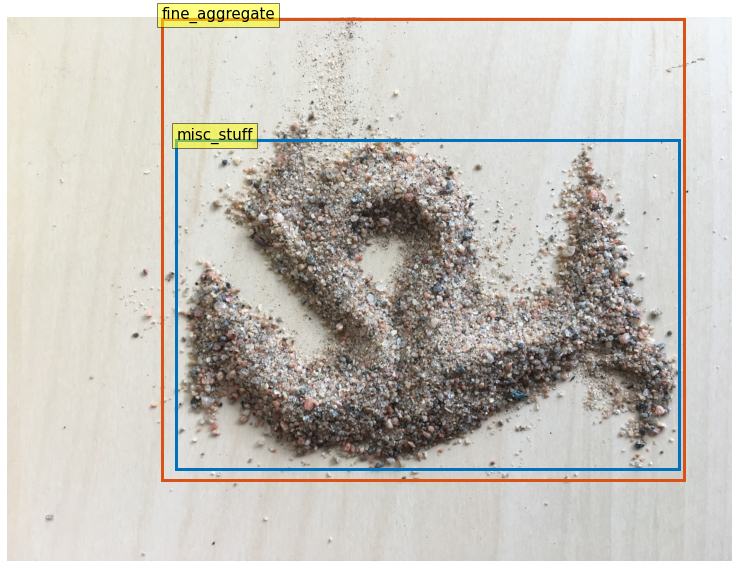

In [50]:
plot_image_with_bbox_category(valid_json_content, 'fine_aggregate_2309.JPG', '/content/data/custom/val2017')

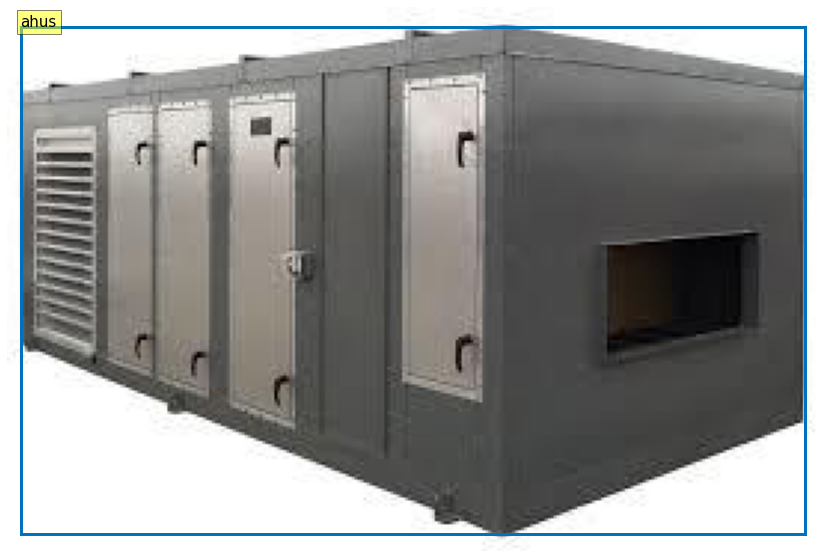

In [60]:
plot_image_with_bbox_category(valid_json_content, 'ahus_392.jpg', '/content/data/custom/val2017')

NB: if the threshold is equal to zero, then you will see all of the 100 query slots. The zero-threshold is only used for illustration. In usual cases, most query slots have a low confidence score, so that irrelevant query slots would be pruned with a higher threshold, such as 0.7 or 0.9.

Reference: https://github.com/facebookresearch/detr/issues/9#issuecomment-635357693

NB²: For fine-tuning purposes, we cannot change the number of query slots.

> If you're fine-tuning, I don't recommend changing the number of queries on the fly, it is extremely unlikely to work out of the box. In this case you're probably better off retraining from scratch (you can change the --num_queries arg from our training script).

Reference: https://github.com/facebookresearch/detr/issues/9#issuecomment-636407752

## Clone custom code of DETR

Clone [my fork](https://github.com/woctezuma/detr/tree/finetune) tailored for a custom dataset:
-   called `custom`,
-   with `max_class_id = 2` ([explanation](https://github.com/facebookresearch/detr/issues/108#issuecomment-650269223)).

**Caveat**: if you later use `first_class_index = 1` for your dataset, then it is fine. However, if you later use `first_class_index = 0`, then you will have to override the value of `max_class_id` (so that it is equal to 1) when calling `!python main.py`. My fork can do that.


In [61]:
%cd /content/

!rm -rf detr
!git clone https://github.com/woctezuma/detr.git

%cd detr/

!git checkout finetune

/content
Cloning into 'detr'...
remote: Enumerating objects: 239, done.
remote: Total 239 (delta 0), reused 0 (delta 0), pack-reused 239
Receiving objects: 100% (239/239), 284.61 KiB | 3.51 MiB/s, done.
Resolving deltas: 100% (131/131), done.
/content/detr
Branch 'finetune' set up to track remote branch 'finetune' from 'origin'.
Switched to a new branch 'finetune'


## Preparing the dataset



The directory structure to be the following:
```
path/to/coco/
├ annotations/  # JSON annotations
│  ├ annotations/custom_train.json
│  └ annotations/custom_val.json
├ train2017/    # training images
└ val2017/      # validation images
```

## Check the dataset after it was pre-processed for fine-tuning

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:
-   Demo of COCO API: https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocoDemo.ipynb

In [62]:
%matplotlib inline
import pycocotools.coco as coco
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

In [63]:
dataDir='/content/data/custom/'
dataType='train2017'
annFile='{}annotations/custom_train.json'.format(dataDir)

In [64]:
# initialize COCO api for instance annotations
coco=COCO(annFile)

loading annotations into memory...
Done (t=1.01s)
creating index...
index created!


In [65]:
coco

In [66]:
# display COCO categories and supercategories
cats = coco.loadCats(coco.getCatIds())

nms=[cat['name'] for cat in cats]
print('Categories: {}'.format(nms))

nms = set([cat['supercategory'] for cat in cats])
print('Super-categories: {}'.format(nms))

Categories: ['misc_stuff', 'aac_blocks', 'adhesives', 'ahus', 'aluminium_frames_for_false_ceiling', 'chiller', 'concrete_mixer_machine', 'concrete_pump_(50%)', 'control_panel', 'cu_piping', 'distribution_transformer', 'dump_truck___tipper_truck', 'emulsion_paint', 'enamel_paint', 'fine_aggregate', 'fire_buckets', 'fire_extinguishers', 'glass_wool', 'grader', 'hoist', 'hollow_concrete_blocks', 'hot_mix_plant', 'hydra_crane', 'interlocked_switched_socket', 'junction_box', 'lime', 'marble', 'metal_primer', 'pipe_fittings', 'rcc_hume_pipes', 'refrigerant_gas', 'river_sand', 'rmc_batching_plant', 'rmu_units', 'sanitary_fixtures', 'skid_steer_loader_(bobcat)', 'smoke_detectors', 'split_units', 'structural_steel_-_channel', 'switch_boards_and_switches', 'texture_paint', 'threaded_rod', 'transit_mixer', 'vcb_panel', 'vitrified_tiles', 'vrf_units', 'water_tank', 'wheel_loader', 'wood_primer', 'banner', 'blanket', 'branch', 'bridge', 'building-other', 'bush', 'cabinet', 'cage', 'cardboard', 'car

In [67]:
cats

[{'id': 0, 'name': 'misc_stuff', 'supercategory': 'coco_thing'},
 {'id': 1, 'name': 'aac_blocks', 'supercategory': 'N/A'},
 {'id': 2, 'name': 'adhesives', 'supercategory': 'N/A'},
 {'id': 3, 'name': 'ahus', 'supercategory': 'N/A'},
 {'id': 4,
  'name': 'aluminium_frames_for_false_ceiling',
  'supercategory': 'N/A'},
 {'id': 5, 'name': 'chiller', 'supercategory': 'N/A'},
 {'id': 6, 'name': 'concrete_mixer_machine', 'supercategory': 'N/A'},
 {'id': 7, 'name': 'concrete_pump_(50%)', 'supercategory': 'N/A'},
 {'id': 8, 'name': 'control_panel', 'supercategory': 'N/A'},
 {'id': 9, 'name': 'cu_piping', 'supercategory': 'N/A'},
 {'id': 10, 'name': 'distribution_transformer', 'supercategory': 'N/A'},
 {'id': 11, 'name': 'dump_truck___tipper_truck', 'supercategory': 'N/A'},
 {'id': 12, 'name': 'emulsion_paint', 'supercategory': 'N/A'},
 {'id': 13, 'name': 'enamel_paint', 'supercategory': 'N/A'},
 {'id': 14, 'name': 'fine_aggregate', 'supercategory': 'N/A'},
 {'id': 15, 'name': 'fire_buckets', 's

In [68]:
# load and display image
catIds = coco.getCatIds(catNms=['aac_blocks', 'adhesives']);
print(catIds)
#imgIds = coco.getImgIds(catIds=catIds );
#print(imgIds)

[1, 2]


### Boilerplate variables

**Caveat**: the parameter name `num_classes` is misleading. It is actually the ID which DETR will reserve for **its own** `no_object` class.

It should be set to one plus the highest class ID in your dataset.

For instance, if you have one class (balloon):
- if you used the index n°0 for this class, then `max_id = 0` and `num_classes = max_id+1 = 1`
- if you used the index n°1 for this class, then `max_id = 1` and `num_classes = max_id+1 = 2`

Reference: https://github.com/facebookresearch/detr/issues/108#issuecomment-650269223

In [69]:
first_class_index = 0

In [70]:
categoryObjList = []
categoryNameList = []

lines = []
with open('/content/data/custom/dataset_labels_super_categories.txt') as f:
    lines = f.readlines()

for line in lines:
    fields = line.split('.')
    category_id = int(fields[0])
    label = fields[1][1:-1]
    catSubCat = label.split('::')
    categoryName = catSubCat[0]
    SubCategoryName = catSubCat[1]
    categoryNameList.append(categoryName)
    categoryObj = {
        "id": category_id, 
        "name":categoryName , 
        "supercategory": SubCategoryName
    }
    categoryObjList.append(categoryObj)

In [71]:
assert(first_class_index in [0, 1])

if first_class_index == 0:

  # There is one class, balloon, with ID n°0.

  num_classes = 140

  finetuned_classes = categoryNameList


  # The `no_object` class will be automatically reserved by DETR with ID equal
  # to `num_classes`, so ID n°1 here.  

else:

  # There is one class, balloon, with ID n°1.
  #
  # However, DETR assumes that indexing starts with 0, as in computer science,
  # so there is a dummy class with ID n°0.
  # Caveat: this dummy class is not the `no_object` class reserved by DETR.

  num_classes = 141
  finetuned_classes = ['N/A']
  finetuned_classes.extend(categoryNameList)

  # The `no_object` class will be automatically reserved by DETR with ID equal
  # to `num_classes`, so ID n°2 here.

print('First class index: {}'.format(first_class_index))  
print('Parameter num_classes: {}'.format(num_classes))
print('Fine-tuned classes: {}'.format(finetuned_classes))

First class index: 0
Parameter num_classes: 140
Fine-tuned classes: ['misc_stuff', 'aac_blocks', 'adhesives', 'ahus', 'aluminium_frames_for_false_ceiling', 'chiller', 'concrete_mixer_machine', 'concrete_pump_(50%)', 'control_panel', 'cu_piping', 'distribution_transformer', 'dump_truck___tipper_truck', 'emulsion_paint', 'enamel_paint', 'fine_aggregate', 'fire_buckets', 'fire_extinguishers', 'glass_wool', 'grader', 'hoist', 'hollow_concrete_blocks', 'hot_mix_plant', 'hydra_crane', 'interlocked_switched_socket', 'junction_box', 'lime', 'marble', 'metal_primer', 'pipe_fittings', 'rcc_hume_pipes', 'refrigerant_gas', 'river_sand', 'rmc_batching_plant', 'rmu_units', 'sanitary_fixtures', 'skid_steer_loader_(bobcat)', 'smoke_detectors', 'split_units', 'structural_steel_-_channel', 'switch_boards_and_switches', 'texture_paint', 'threaded_rod', 'transit_mixer', 'vcb_panel', 'vitrified_tiles', 'vrf_units', 'water_tank', 'wheel_loader', 'wood_primer', 'banner', 'blanket', 'branch', 'bridge', 'build

In [72]:
%cd /content/detr/

/content/detr


In [73]:
! ls

d2	    engine.py	main.py    requirements.txt	 tox.ini
datasets    hubconf.py	models	   run_with_submitit.py  util
Dockerfile  LICENSE	README.md  test_all.py


**Caveat**: below, we override the value of `num_classes` (hard-coded to 2 for the `custom` dataset in my `finetune` branch of DETR) in case `first_class_index = 0` instead of `first_class_index = 1` (default value).

In [74]:
! ls -l /content/data/custom/val2017

total 551796
-rw-r--r-- 1 root root   34222 Sep  8 01:05  aac_blocks_110.jpg
-rw-r--r-- 1 root root   12795 Sep  8 01:05  aac_blocks_122.jpg
-rw-r--r-- 1 root root   30181 Sep  8 01:05  aac_blocks_128.jpg
-rw-r--r-- 1 root root   61180 Sep  8 01:05  aac_blocks_198.jpg
-rw-r--r-- 1 root root  261856 Sep  8 01:05  aac_blocks_209.jpg
-rw-r--r-- 1 root root    9993 Sep  8 01:05  aac_blocks_239.jpg
-rw-r--r-- 1 root root    5066 Sep  8 01:05  adhesives_279.jpg
-rw-r--r-- 1 root root   10189 Sep  8 01:05  adhesives_288.jpg
-rw-r--r-- 1 root root   12908 Sep  8 01:05  adhesives_315.jpg
-rw-r--r-- 1 root root   14344 Sep  8 01:05  adhesives_332.jpg
-rw-r--r-- 1 root root   85357 Sep  8 01:05  adhesives_334.jpg
-rw-r--r-- 1 root root  106416 Sep  8 01:05  adhesives_350.jpg
-rw-r--r-- 1 root root   99276 Sep  8 01:05  adhesives_356.jpg
-rw-r--r-- 1 root root  136399 Sep  8 01:05  adhesives_360.jpg
-rw-r--r-- 1 root root   52940 Sep  8 01:05  ahus_375.jpg
-rw-r--r-- 1 root root    6471 Sep  8 01:

## Check the results

### Monitoring of training

Reference: https://github.com/lessw2020/Thunder-Detr/blob/master/View_your_training_results.ipynb

In [75]:
from util.plot_utils import plot_logs

from pathlib import Path

log_directory = [Path('/content/drive/My Drive/capstone_epoch6_output/')]

As mentioned in the code of [`plot_logs`](https://github.com/facebookresearch/detr/blob/5e66b4cd15b2b182da347103dd16578d28b49d69/util/plot_utils.py#L13):
-   solid lines are training results,
-   dashed lines are validation results.

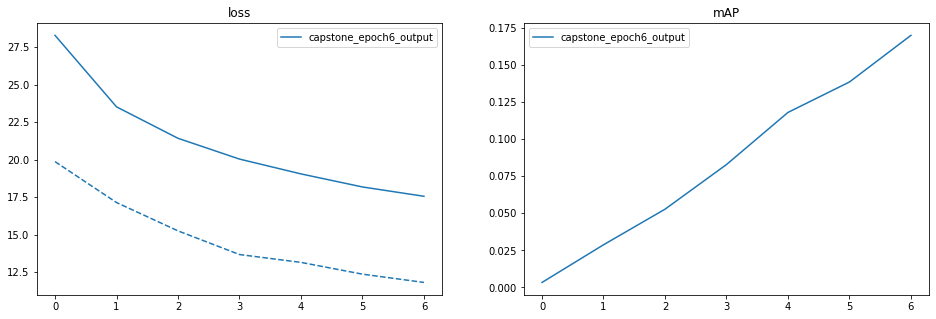

In [77]:
fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

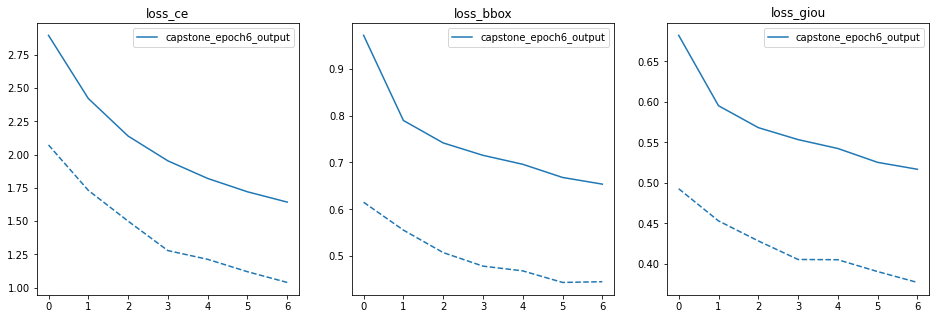

In [78]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

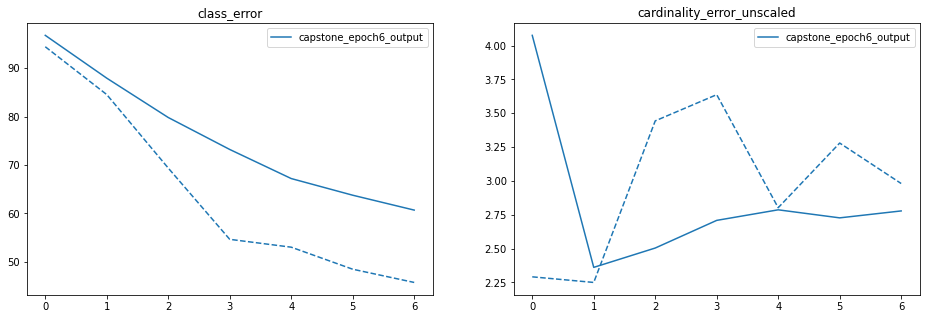

In [79]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)   

### Load the fine-tuned model

- How to replace the classification head: https://github.com/facebookresearch/detr/issues/9#issuecomment-636391562

In [80]:
model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=num_classes)
model.num_queries=30
model.query_embed = torch.nn.modules.sparse.Embedding(30, 256)


checkpoint = torch.load('/content/drive/My Drive/capstone_epoch6_output/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval();

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_master


### Boilerplate functions to display fine-tuned results

In [81]:
def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [82]:
def run_worflow(my_image, my_model):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)

  for threshold in [0.9, 0.7]:
    
    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)

    plot_finetuned_results(my_image,
                           probas_to_keep, 
                           bboxes_scaled)


In [83]:
ls -l '/content/data/custom/val2017'

total 551796
-rw-r--r-- 1 root root   34222 Sep  8 01:05  aac_blocks_110.jpg
-rw-r--r-- 1 root root   12795 Sep  8 01:05  aac_blocks_122.jpg
-rw-r--r-- 1 root root   30181 Sep  8 01:05  aac_blocks_128.jpg
-rw-r--r-- 1 root root   61180 Sep  8 01:05  aac_blocks_198.jpg
-rw-r--r-- 1 root root  261856 Sep  8 01:05  aac_blocks_209.jpg
-rw-r--r-- 1 root root    9993 Sep  8 01:05  aac_blocks_239.jpg
-rw-r--r-- 1 root root    5066 Sep  8 01:05  adhesives_279.jpg
-rw-r--r-- 1 root root   10189 Sep  8 01:05  adhesives_288.jpg
-rw-r--r-- 1 root root   12908 Sep  8 01:05  adhesives_315.jpg
-rw-r--r-- 1 root root   14344 Sep  8 01:05  adhesives_332.jpg
-rw-r--r-- 1 root root   85357 Sep  8 01:05  adhesives_334.jpg
-rw-r--r-- 1 root root  106416 Sep  8 01:05  adhesives_350.jpg
-rw-r--r-- 1 root root   99276 Sep  8 01:05  adhesives_356.jpg
-rw-r--r-- 1 root root  136399 Sep  8 01:05  adhesives_360.jpg
-rw-r--r-- 1 root root   52940 Sep  8 01:05  ahus_375.jpg
-rw-r--r-- 1 root root    6471 Sep  8 01:

### With a few validation images

In [85]:
image_name = 'switch_boards_and_switches_11841.jpg'
image_dir = '/content/data/custom/val2017'

## Ground Truth

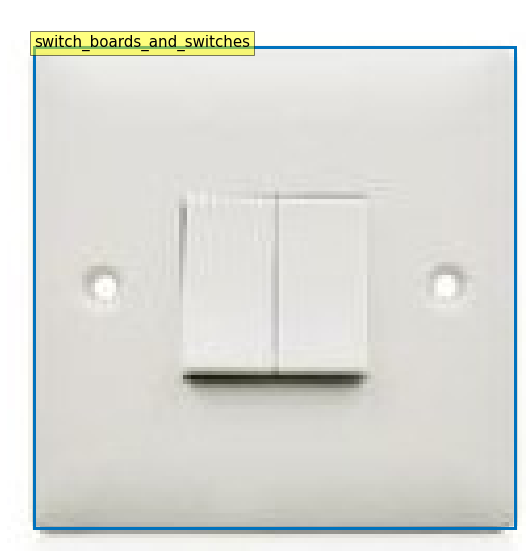

In [86]:
plot_image_with_bbox_category(valid_json_content, image_name, image_dir)

## Predicted Image

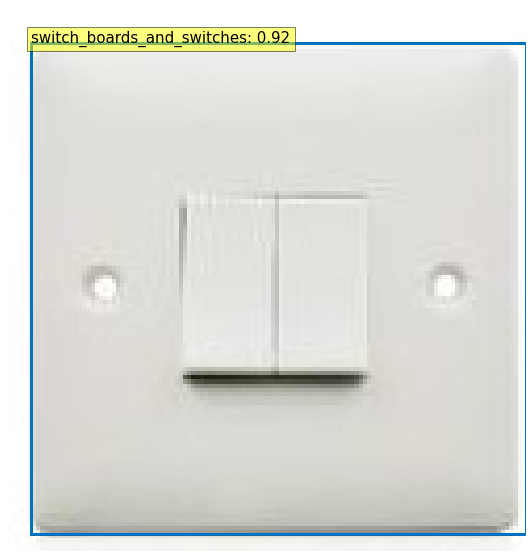

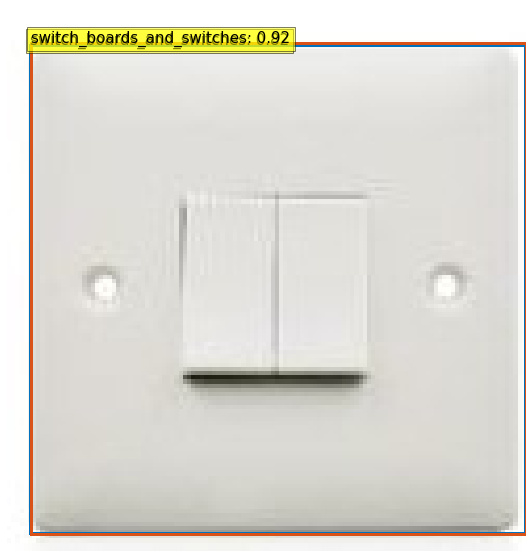

In [92]:
image_path = image_dir + '/' + image_name
im = Image.open(image_path)

run_worflow(im,   model)

In [115]:
image_name = 'fine_aggregate_2313.JPG'
image_dir = '/content/data/custom/val2017'

## Ground Truth

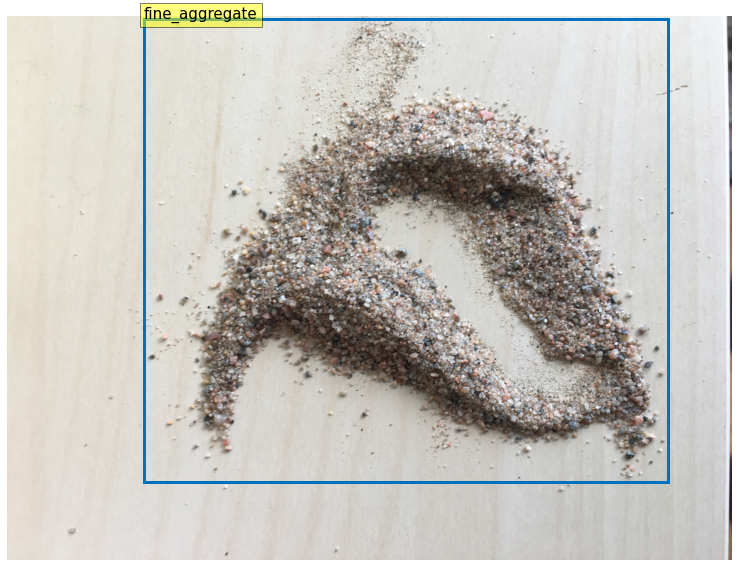

In [116]:
plot_image_with_bbox_category(valid_json_content, image_name, image_dir)

## Predicted

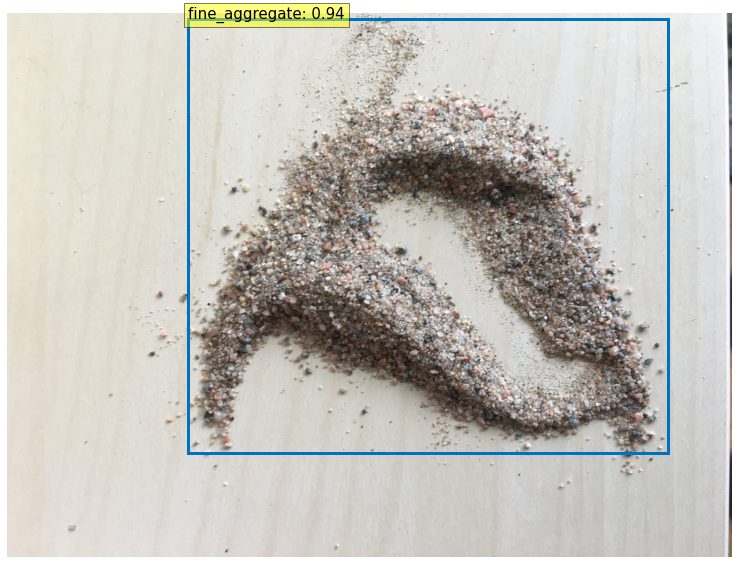

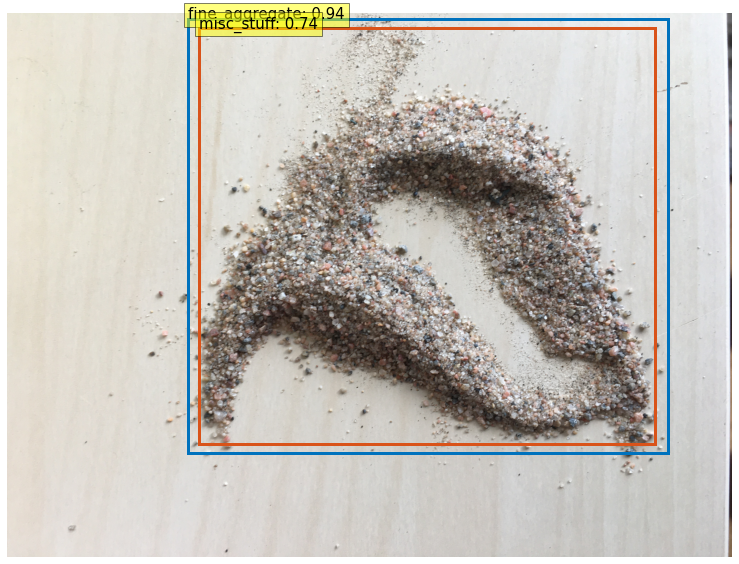

In [117]:
image_path = image_dir + '/' + image_name
im = Image.open(image_path)

run_worflow(im,   model)

In [93]:
image_name = 'switch_boards_and_switches_11865.jpeg'
image_dir = '/content/data/custom/val2017'

## Ground Truth

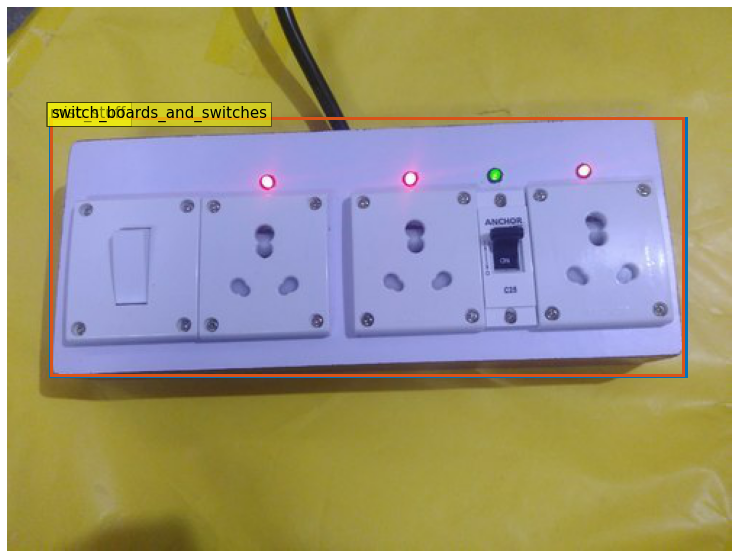

In [94]:
plot_image_with_bbox_category(valid_json_content, image_name, image_dir)

## Predicted Image

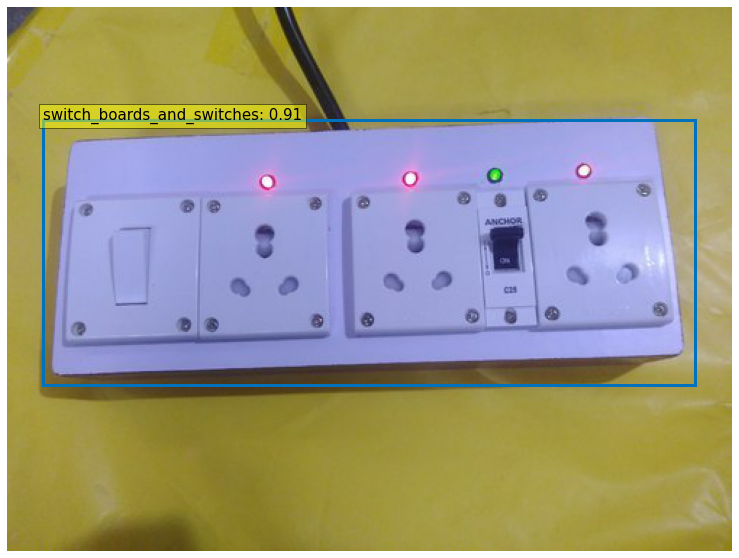

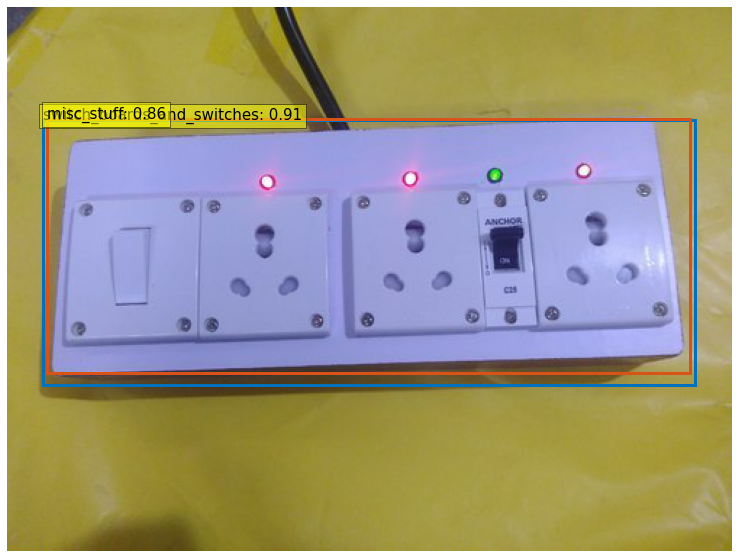

In [96]:
image_path = image_dir + '/' + image_name
im = Image.open(image_path)

run_worflow(im,   model)

In [100]:
image_name = 'cu_piping_1344.jpg'
image_dir = '/content/data/custom/val2017'

## Ground Truth

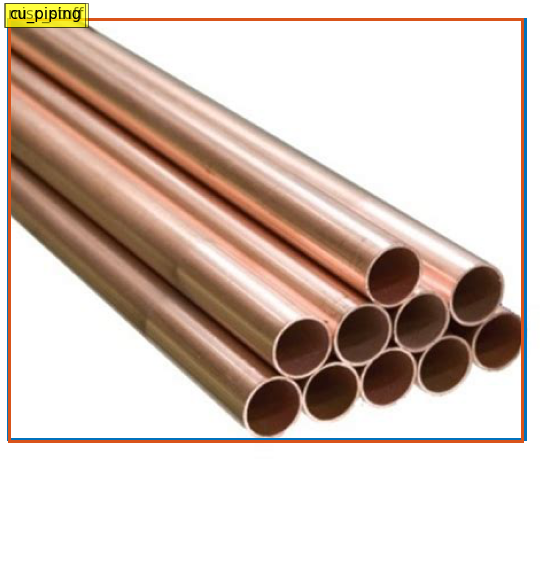

In [101]:
plot_image_with_bbox_category(valid_json_content, image_name, image_dir)

## Predicted

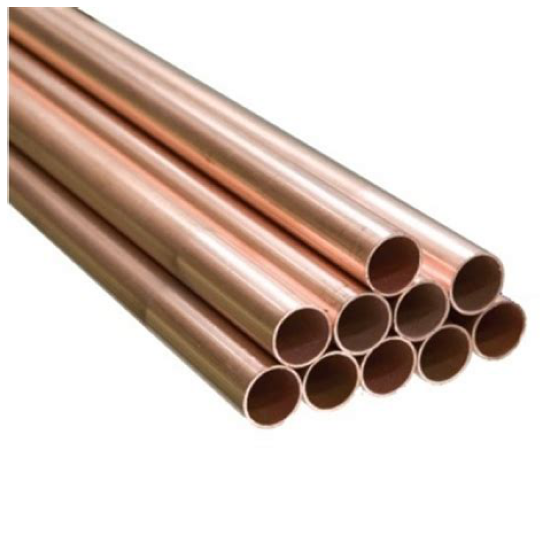

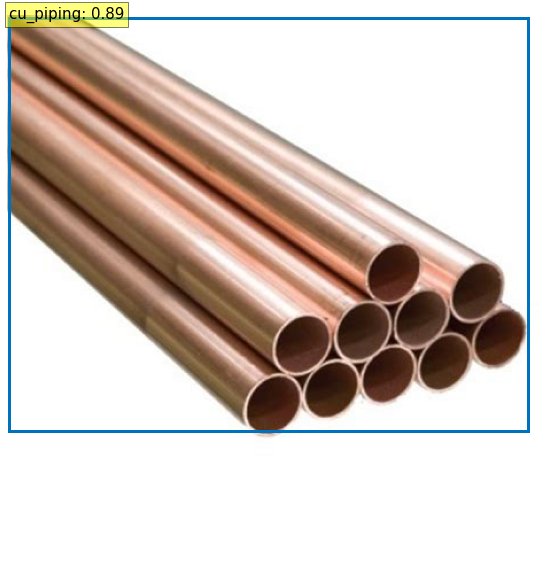

In [102]:
image_path = image_dir + '/' + image_name
im = Image.open(image_path)

run_worflow(im,   model)

In [97]:
image_name = 'cu_piping_1346.jpg'
image_dir = '/content/data/custom/val2017'

## Ground Truth

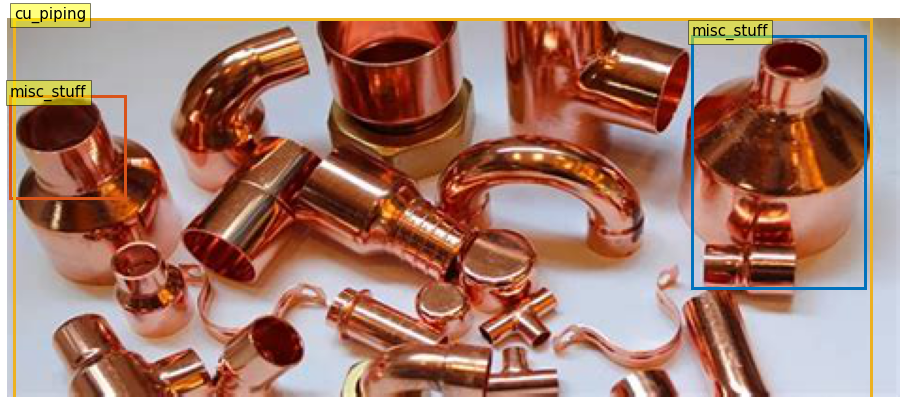

In [98]:
plot_image_with_bbox_category(valid_json_content, image_name, image_dir)

## Predicted

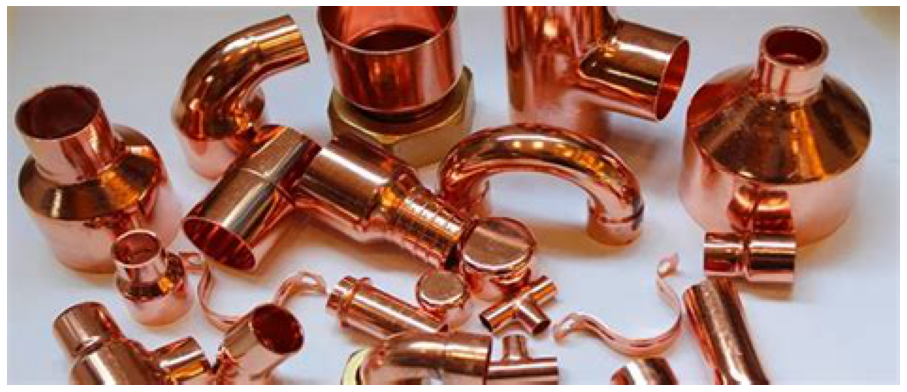

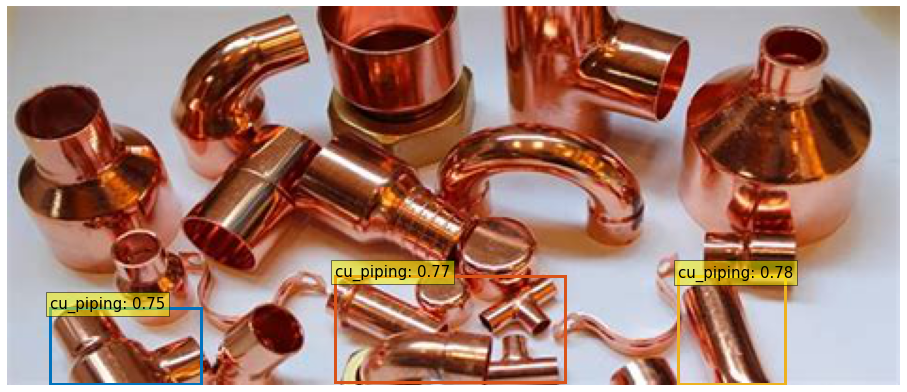

In [99]:
image_path = image_dir + '/' + image_name
im = Image.open(image_path)

run_worflow(im,   model)

In [103]:
image_name = 'cu_piping_1393.jpg'
image_dir = '/content/data/custom/val2017'

## Ground Truth

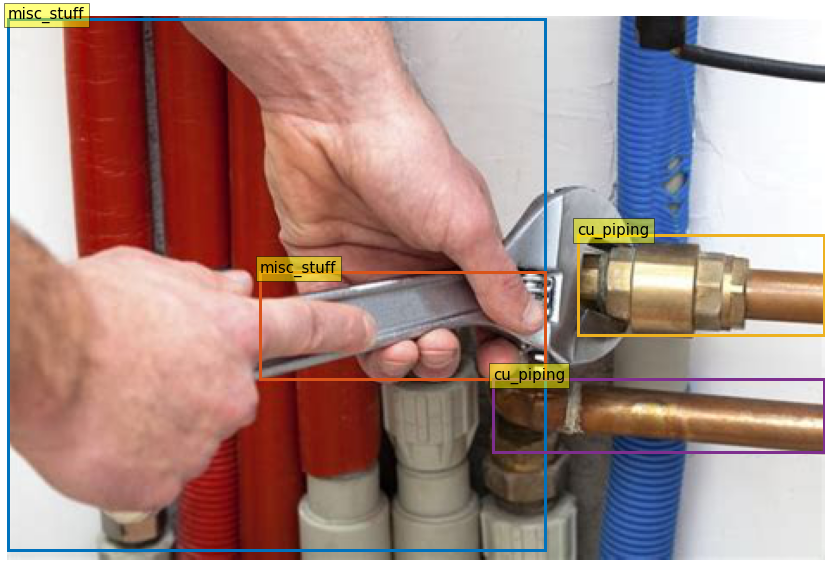

In [104]:
plot_image_with_bbox_category(valid_json_content, image_name, image_dir)

## Predicted

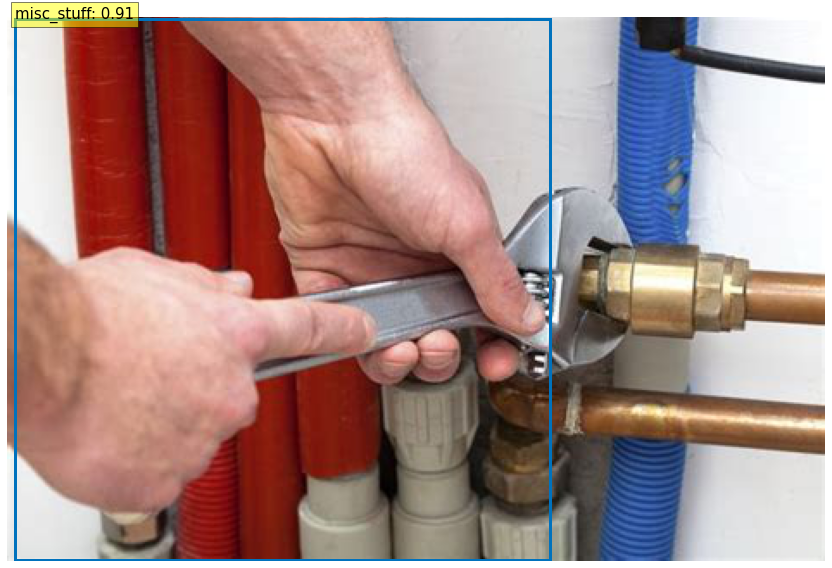

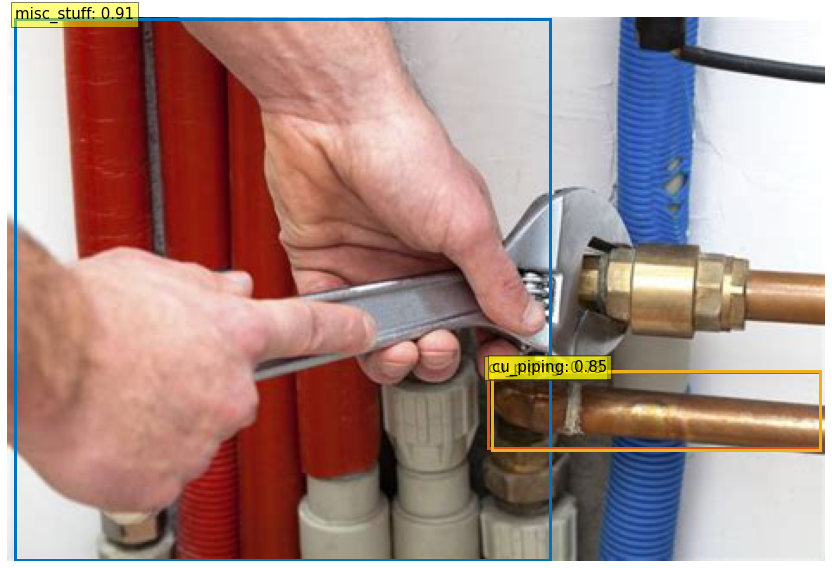

In [105]:
image_path = image_dir + '/' + image_name
im = Image.open(image_path)

run_worflow(im,   model)

In [106]:
image_name = 'split_units_11256.jpg'
image_dir = '/content/data/custom/val2017'


## Ground Truth

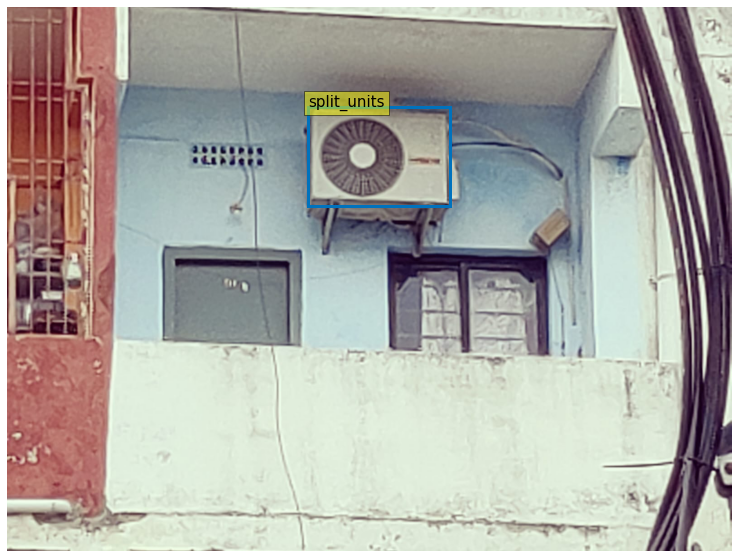

In [107]:
plot_image_with_bbox_category(valid_json_content, image_name, image_dir)

## Predicted

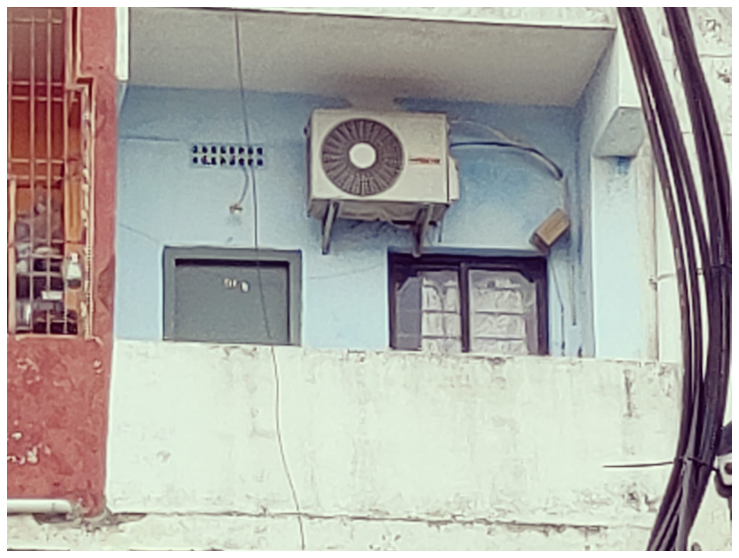

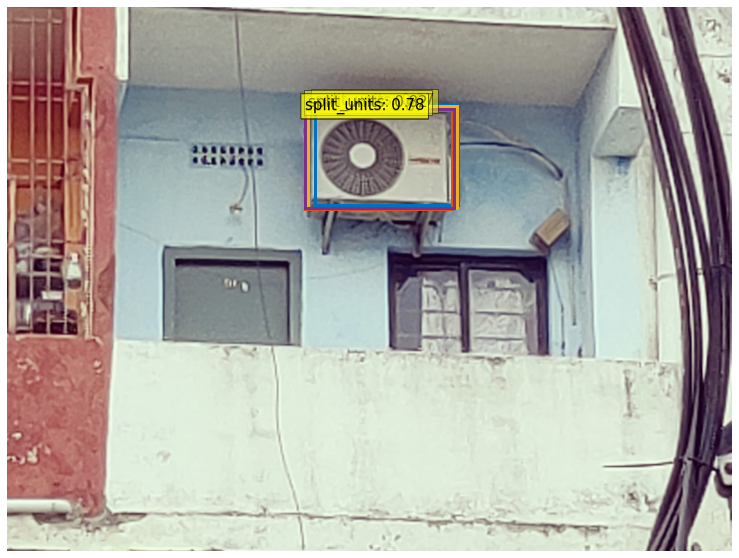

In [108]:
image_path = image_dir + '/' + image_name
im = Image.open(image_path)

run_worflow(im,   model)